🐶 **END TO END MULTI-CLASS DOG BREED PREDICTION**

This notebook tries to bulid a end to end project of image classifier using TenserFlow 2.0 and TenserFlow Hub.


### 1.PROBLEM
Identify the bread of the dog using the image given to us.

### 2.DATA
The data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/data

### 3.EVALUATION
The evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

### 4.FEATURES
Some information about the data :
. we are working with images (unstructured dat) so best to use Deep learning / transfer learning.

.There are 120 breeds of dogs (this means there are 120 different classes).

.There are around 10,000+ images in the training set (these images have labels).

.There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


### Unzipping the files for getting data ready

In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/DOG_VISION 2.0/dog-breed-identification (1).zip" -d "drive/My Drive/DOG_VISION 2.0/"


### Getting our workspace ready!

* Import TensorFlow ✅
* Import TenserFlow Hub ✅
* Make sure we are using a GPU ?

In [ ]:
from tensorflow.python.framework.config import list_physical_devices
# import TensorFlow in the colab notebook
import tensorflow as tf
print("TF Version : " , tf.__version__)
#import tensorflow hub
import tensorflow_hub as hub
print("TF Hub Version : " , hub.__version__)
# Check GPU is available or not
print("GPU" , "is available" if tf.config.list_physical_devices("GPU")
                             else 'Not available')



TF Version :  2.12.0
TF Hub Version :  0.13.0
GPU is available


### **Getting our data ready (Turning into tensors)**

*with all ML models , our data has to be in numerical format . So thats what we will be doing first, Turning our images into tensors (Numeric format)*

In [ ]:
# lets see the label of our data given to us
import pandas as pd
label_csv = pd.read_csv("drive/MyDrive/DOG_VISION 2.0/labels.csv")


In [ ]:
label_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# how many images are there of each breed???
label_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

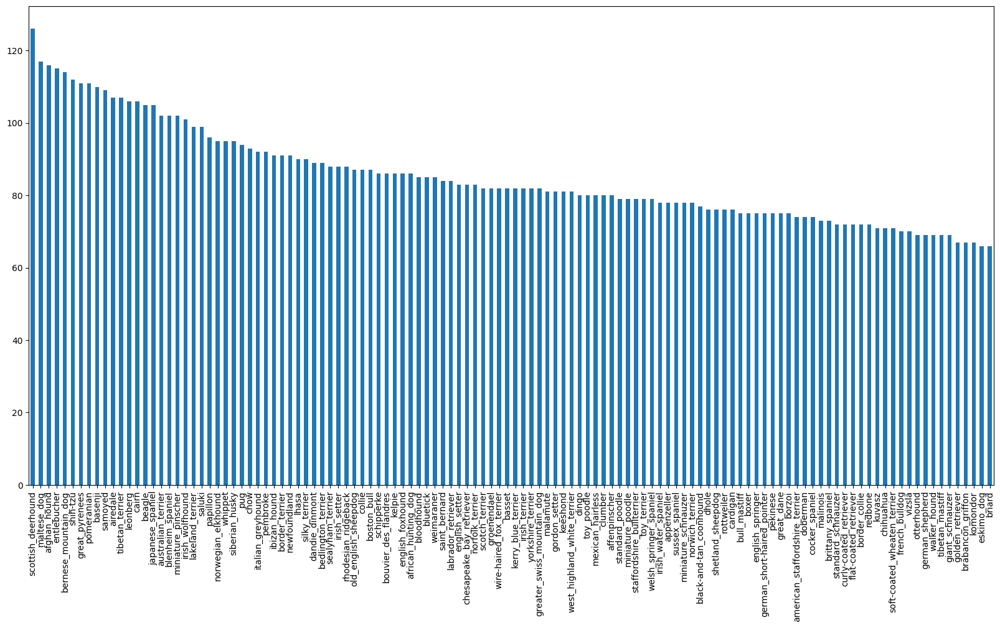

In [ ]:
label_csv.breed.value_counts().plot(kind="bar" , figsize=(20,10));


In [ ]:
label_csv["breed"].value_counts().median()

82.0

### **Getting images and their labels**

In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from image ID's
filenames = ["drive/MyDrive/DOG_VISION 2.0/train/" + fname + ".jpg"
              for fname in label_csv["id"]]

filenames[:10]

['drive/MyDrive/DOG_VISION 2.0/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DOG_VISION 2.0/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DOG_VISION 2.0/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DOG_VISION 2.0/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DOG_VISION 2.0/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DOG_VISION 2.0/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DOG_VISION 2.0/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DOG_VISION 2.0/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DOG_VISION 2.0/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DOG_VISION 2.0/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# check whether number of filenames matches the actual images provided to us
import os
if len(os.listdir("drive/MyDrive/DOG_VISION 2.0/train/")) == len(filenames):
  print(f"filenames match both contain same number of images and that is:{len(filenames)}")
else:
   print("Filenames do no match actual amount of files, check the target directory.")


filenames match both contain same number of images and that is:10222


In [ ]:
len(filenames)

10222

In [ ]:
len(os.listdir("drive/MyDrive/DOG_VISION 2.0/train/"))

10222

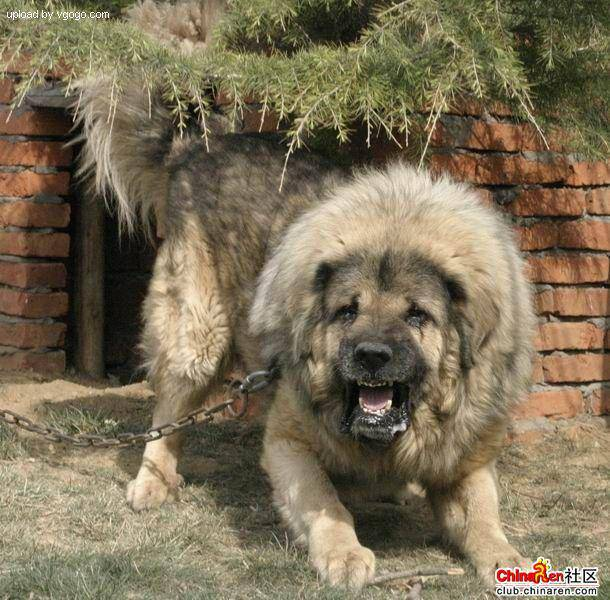

In [ ]:
#Lest view an image
from IPython.display import Image
#one more check
Image(filenames[9000])

In [ ]:
label_csv["breed"][9000]

'tibetan_mastiff'

#### *since we have now got our training image filepaths in a list, let's prepare our label*

In [ ]:
import numpy as np
labels =label_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [ ]:
#Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds
len(unique_breeds)

120

In [ ]:
##Turn a single label into an array of boolens
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
from numpy.lib.function_base import append
from numpy.lib.arraysetops import unique
## Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
## EXample : Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) # index where this label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be 1 in True and 0 in False

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


###Creating our own validaton set

since the dataset has only train set we will create a validation set by our own

In [ ]:
#setup X and y variables
X = filenames
y = boolean_labels

we're going to start with a 1000 samples of images and will increased as needed

In [ ]:
## set number of images to use experimenting
NUM_IMAGES = 1000 #@param {type:"slider" , min:1000 , max:10000 , step:1000}

In [ ]:
# spilt our data into train and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)
#spliting it into train , validation
X_train , X_val , y_train , y_val = train_test_split(X[:NUM_IMAGES] , y[:NUM_IMAGES] , test_size=0.2)

len(X_train) , len(y_val) , len(y_train) , len(y_val)

(800, 200, 800, 200)

### Preprocessing the images (turning images into Tensors)


To preprocesss our images into tensors we're going to write a function which will do few steps for conversion

1. Take an image filepath as input
2. use TensorFLow to read the file and save it into variable , `image`
3. Turn `image`(jpg) into Tensor
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image


In [ ]:
## converting image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[30])
image.shape

(338, 450, 3)

In [ ]:
image.max() , image.min()

(255, 0)

In [ ]:
##turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 450, 3), dtype=uint8, numpy=
array([[[171, 115,  78],
        [170, 114,  77],
        [168, 114,  76],
        ...,
        [193, 165,  91],
        [187, 169,  93],
        [187, 169,  93]],

       [[172, 116,  79],
        [171, 115,  78],
        [169, 115,  77],
        ...,
        [198, 170,  96],
        [193, 174,  98],
        [193, 174,  98]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_img(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

###Turning data into `batches`


*Question : why to turn our data into batches ??*

*take an example we are have 10000+ images we  have to process it in one go.they all might not fit into memory.*

*So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).*


*In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`.*

In [ ]:
# create a function to return a tuple i.e (image, label)

def get_image_label(image_path  , label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).

  """

  image  = process_img(image_path)
  return image , label

In [ ]:
## demo of the above
(process_img(X[42]) , tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
## demo using the same function
get_image_label(X[42]  , tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
## define the batch size , 32 is okay for a start & also a default value
BATCH_SIZE = 32

# Create a function to turn data into batches

def create_data_batches(X , y=None , batch_size = BATCH_SIZE , valid_data = False , test_data = False):
   """
   Creates batches of data out of image (X) and label (y) pairs.
   Shuffles the data if it's training data but doesn't shuffle if it's validation data.

   """
   ##if the dataset is the test dataset , we dont have to label attached to it
   if test_data:
     print("Creating test data batches...")
     data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepath
     data_batch = data.map(process_img).batch(BATCH_SIZE)
     return data_batch
   # If the data is a valid dataset, we don't need to shuffle it
   elif valid_data:
     print("Creating validation data batches...")
     data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
     data_batch = data.map(get_image_label).batch(BATCH_SIZE)
     return data_batch

   else:
     print("Creating training data batches...")
     # Turn filepaths and labels into Tensors
     data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
     # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
     data = data.shuffle(buffer_size = len(X))

     # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
     data = data.map(get_image_label)

     # Turn the training data into batches
     data_batch = data.batch(BATCH_SIZE)
     return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

##Visualizing Data Batches

 *our data is in batches , these can be little hard to understand lets visualize them !!!*

In [ ]:
import matplotlib.pyplot as plt
# create a function for viewing images in a bata baches
def show_25_images(images , labels):
  """
  Displays a plot of 25 images and their labels from a data batch.

  """
  #setup the fig
  plt.figure(figsize= (10,10))
  #loop through 25 (for displaying 25 images)
  for i in range(25):
    #create subplots (5rows , 5columns)
    ax = plt.subplot(5 , 5 , i+1)
    #display image
    plt.imshow(images[i])
    # add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

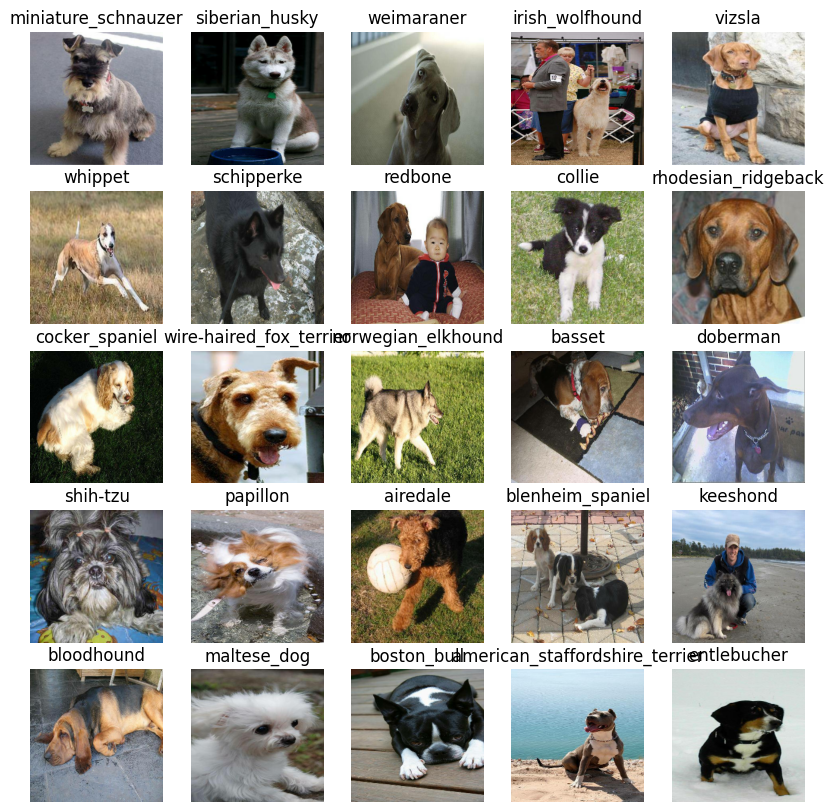

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

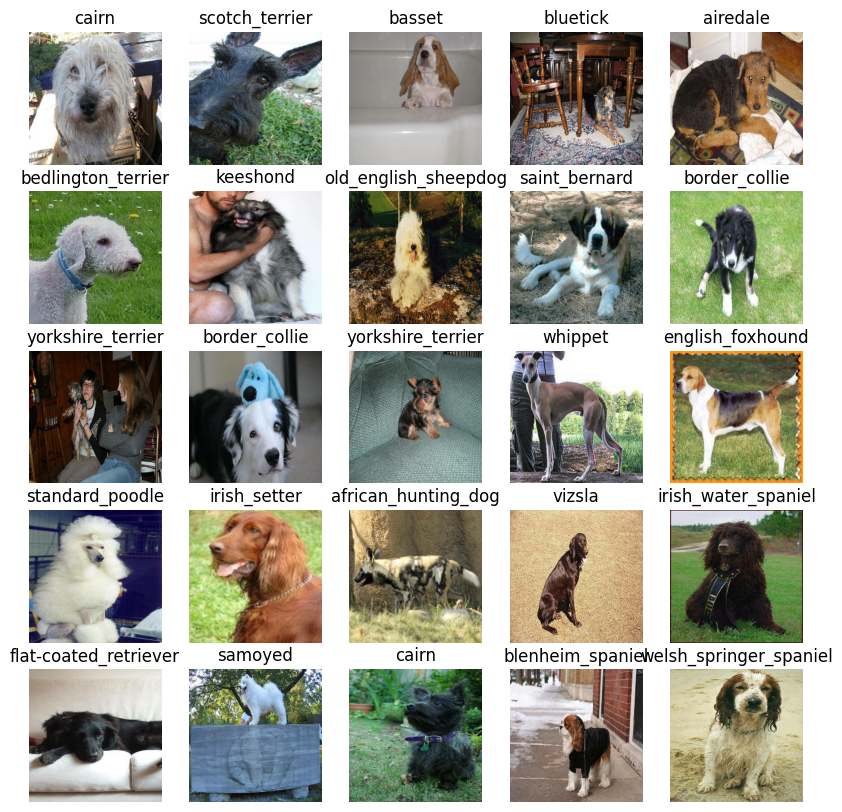

In [ ]:
# Now let's visualize the data in a validation batch
val_images , val_label = next(val_data.as_numpy_iterator())

show_25_images(val_images , val_label)

## Building a model

*before we bulid a model , there are few things we need to define*

*The input shape (our images shape, in the form of Tensors) to our model.

*The output shape (image labels, in the form of Tensors) of our model.

*The URL of the model we want to use from TensorFlow Hub -https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
IMG_SIZE


224

In [ ]:
#setup input shape to the model
INPUT_SHAPE = [None , IMG_SIZE , IMG_SIZE , 3] #batch , height , width , colour channel

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

*Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!*

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.

* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).

* Compiles the model (says it should be evaluated and improved).

* Builds the model (tells the model the input shape it'll be getting).
Returns the model.

*All of these steps can be found here:* https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callback in our notebook

*Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.*

*We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.*

### TensorBoard callback

To setup a TensorBoard callback , we need to do 3 things

* Load the TensorBoard notebook extension

* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.

*Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [ ]:
## Load TensorBoard notebook extension

%load_ext tensorboard

In [ ]:

import datetime

#create a function to bulid a TensorBoard callback
def create_tensorboard_callback():

   # Create a log directory for storing TensorBoard logs
   logdir = os.path.join("drive/MyDrive/DOG_VISION 2.0/logs",
                          # Make it so the logs get tracked whenever we run an experiment
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

   return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback
*Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.*

In [ ]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy" ,
                                                   patience = 3)

### Traning a model (on subset data)

Our first model is only going to 1000 images , to make sure everythings is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type : "slider" , min:10 , max:100 , step:10}

In [ ]:
# check whether we have GPU support or not
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available (:")

GPU available (YESSS!!!!!!)


Lets create a function which will train a model

* Create a model using create_model()
* setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the fit() function on our model passing it the training data, validation data,
  number of epochs to train for(`NUM_EPOCHS`) and the callback we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.

  """
  #Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #fit the model to the data passing it the callbacks we created
  model.fit( x = train_data ,
             epochs = NUM_EPOCHS,
            validation_data= val_data,
            validation_freq= 1,
            callbacks = [tensorboard , early_stopping] )
  # Return the fitted model
  return model


In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 20s 171ms/step - loss: 4.4811 - accuracy: 0.1000 - val_loss: 3.3209 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 3s 123ms/step - loss: 1.5928 - accuracy: 0.7013 - val_loss: 2.1064 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 4s 164ms/step - loss: 0.5420 - accuracy: 0.9475 - val_loss: 1.6218 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 143ms/step - loss: 0.2414 - accuracy: 0.9937 - val_loss: 1.4415 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 3s 119ms/step - loss: 0.1421 - accuracy: 0.9987 - val_loss: 1.3640 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 4s 151ms/step - loss: 0.0987 - accuracy: 0.9987 - val_loss: 1.3244 - val_accuracy: 0.6450
Epoch 7/100
25/25 [=============================

`NOTE` : - our model is overfitting and that good , it means that our model is learning

### Checking the TensorBoard logs
The TensorBoard magic functions (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/DOG_VISION\ 2.0/logs

<IPython.core.display.Javascript object>

### Making and evaluating predicition using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make prediction on the validation data (not used to train on)
predictions = model.predict(val_data , verbose =1 )
predictions

7/7 [==============================] - 2s 148ms/step


array([[1.75601314e-03, 1.31780893e-04, 4.02349106e-04, ...,
        8.07271223e-04, 1.71919037e-05, 1.16306054e-03],
       [3.83869302e-03, 3.01040220e-03, 8.37923680e-03, ...,
        1.86136109e-03, 5.10089053e-03, 3.02057684e-04],
       [1.90786955e-06, 2.56464467e-04, 1.34855991e-05, ...,
        4.27439727e-06, 5.21261609e-06, 1.96597539e-03],
       ...,
       [2.20931233e-05, 2.25303756e-05, 3.56269411e-05, ...,
        4.81679763e-06, 1.01607235e-04, 4.83942640e-05],
       [2.52115261e-03, 3.38342652e-04, 9.48391516e-06, ...,
        2.95571575e-04, 4.35805996e-05, 1.72544047e-02],
       [2.08399259e-04, 3.02177273e-06, 1.71562264e-04, ...,
        3.54716717e-03, 5.40837122e-04, 2.72126144e-05]], dtype=float32)

In [ ]:
predictions[0]

array([1.7560131e-03, 1.3178089e-04, 4.0234911e-04, 4.0118794e-05,
       2.0346005e-04, 2.2596099e-04, 6.8817399e-03, 1.9216075e-04,
       1.3405606e-04, 3.4639423e-04, 1.1562238e-03, 4.0814589e-04,
       3.4966265e-04, 6.7030880e-05, 7.0638949e-04, 1.8824392e-04,
       3.0865541e-04, 1.8827204e-01, 5.8005029e-05, 1.1637584e-04,
       1.9145795e-04, 9.1425354e-05, 7.9667363e-05, 1.1637977e-03,
       4.1325682e-05, 7.0459076e-04, 6.9298774e-02, 3.1151689e-04,
       1.2132401e-04, 6.9888119e-05, 4.9679948e-05, 7.4650452e-04,
       4.1824122e-04, 8.2145416e-05, 3.0376986e-04, 4.2788155e-02,
       6.4086853e-05, 5.6921615e-04, 8.0037011e-05, 9.1732218e-04,
       2.0991376e-04, 6.7291308e-05, 1.6761844e-05, 3.9836456e-04,
       1.7489368e-05, 6.4805812e-05, 2.6197777e-05, 2.1453011e-04,
       3.6889635e-04, 7.9936360e-04, 6.6469038e-05, 5.9844475e-05,
       1.5554033e-03, 1.9678337e-04, 2.4995353e-04, 1.4230986e-04,
       2.7741049e-04, 3.7710753e-03, 1.6541793e-03, 2.2008669e

In [ ]:
# First Prediction
index = 42
print (predictions[index])
print(f"MAX value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index : {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.54592441e-05 4.45960068e-05 3.83732477e-05 5.81280347e-06
 2.21380848e-03 1.33112044e-04 1.00359306e-04 7.89149199e-04
 2.73171323e-03 2.36456413e-02 5.08969351e-05 1.59380597e-05
 4.45120735e-04 5.63747482e-03 6.48558780e-04 1.45135133e-03
 1.48453391e-05 5.71688055e-04 6.63318642e-05 4.81683091e-04
 2.07983139e-05 6.97841868e-04 3.90458845e-05 4.16804723e-05
 1.88384335e-02 3.39372127e-05 3.10493269e-05 2.12048006e-04
 1.94511886e-04 3.02039607e-05 3.92947113e-04 2.47945281e-04
 7.38504241e-05 2.84515463e-05 2.62542198e-05 1.34262416e-04
 2.69648997e-04 2.52088124e-04 2.64949813e-05 3.48580539e-01
 3.88324494e-04 5.40269320e-05 4.94708773e-03 5.02383591e-06
 1.36654955e-04 1.59992487e-05 1.23477847e-04 5.43032656e-04
 1.55875150e-05 6.35371660e-04 3.11614895e-05 8.94221957e-05
 4.15476417e-04 1.36637187e-03 3.22425913e-05 1.20593664e-04
 1.42867240e-04 8.10387792e-05 2.86372670e-04 5.92598954e-05
 9.13868062e-05 9.24062333e-05 4.36751134e-06 4.61171148e-05
 4.08455417e-05 1.329729

In [ ]:
unique_breeds[113]

'walker_hound'

In [ ]:
# Turn prediction probabilites into their respective label(easier to understand)
def get_pred_label (prediction_probabilites):
  """
  Turns an array of prediction probabilites into labels

  """
  return unique_breeds[np.argmax(prediction_probabilites)]

# get a predicted label based on an array of predicition probabilites
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

now since our validation data is still in a batch dataset, well have to unbatchify it to make prediction on the validation images and then compare those prediction to the validation labels(true labels)


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image , label) Tensors and return separate arrays of images and labels

  """
  images = []
  labels = []
  # loops through unbatched data
  for image , label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images , labels




In [ ]:
# Unbatchify the validation data
val_images , val_labels = unbatchify(val_data)
val_images[0] , val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

from pandas.core.arrays import integer
Now we've got ways to get :

* Prediction labels
* Validation labels(truth label)
* Validation images

Lets make some function to make these all a bit more visaulize

We'll create a function which :


* Takes an array of prediction probabilites, an array of truth labels and an array of images and an integer
* Convert the prediction probabilites to a predicted label.
* Plot the predicted label , its predicted probability, the truth and the target images on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

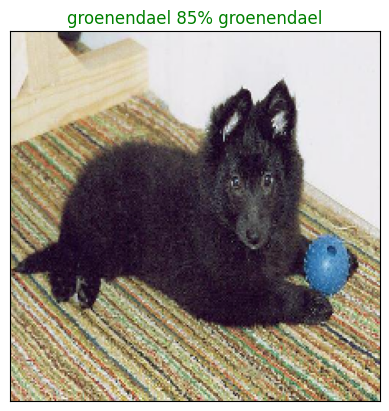

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.


THIS FUNCTION WILL :
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_preds_label()
* Find the top  10:
  a) Prediction probabilities indexes
  b) Prediction probabilities values
  c) Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels , n = 1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for samples n

  """

  pred_prob , true_label  = prediction_probabilities[n] , labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #Find the top 10 prediction confidence values
  top_10_pred_values  = pred_prob[top_10_pred_indexes]
  #Find the top 10 prediction labels
  top_10_pred_labels  = unique_breeds[top_10_pred_indexes]

  #Setup the plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "red")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  #Change colour of true label
  if np.isin(true_label , top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



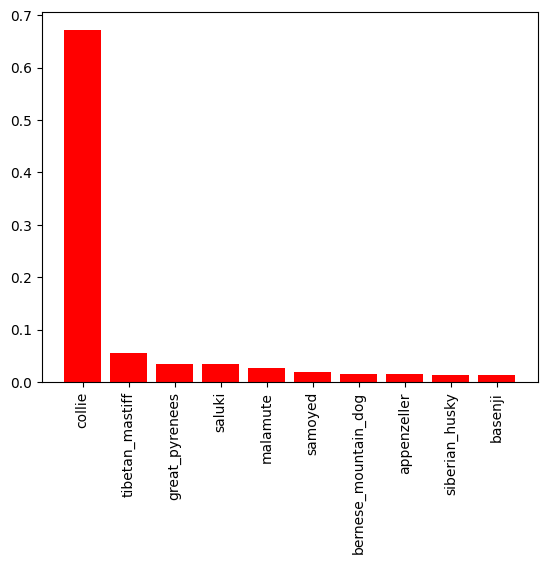

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

Now we have got a function to help us visualize our predictions and evaluate our model,
lets check out a few.

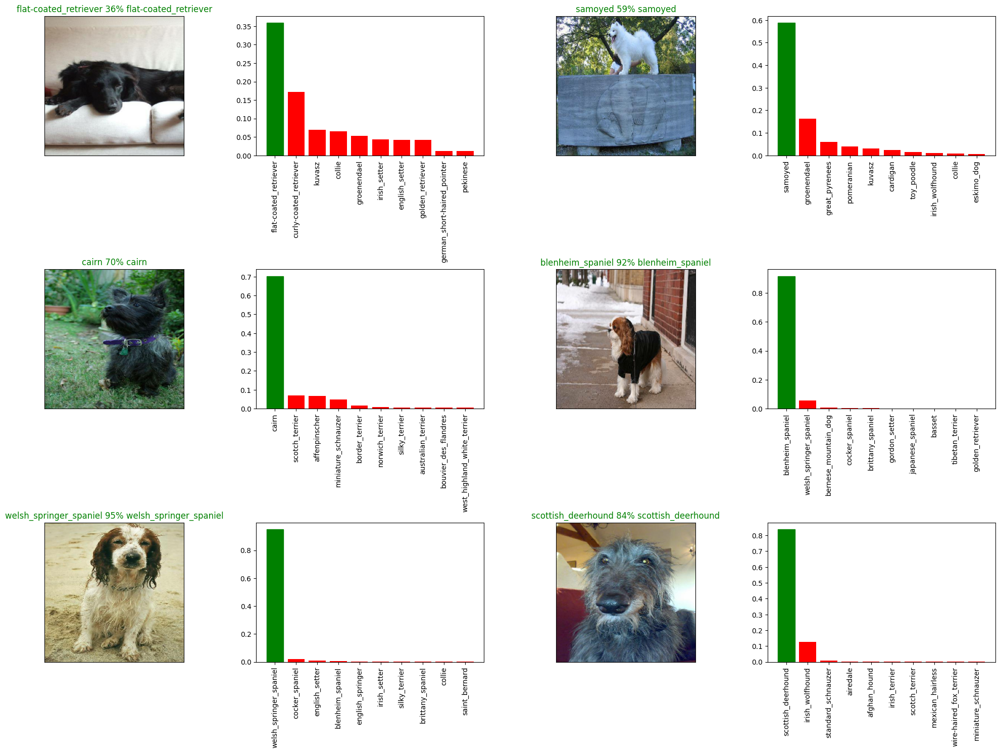

In [ ]:
# Let's check out a few predictions and their different values

i_multiplier = 20
num_rows  = 3
num_cols  = 2
num_images = num_rows*num_cols
plt.figure (figsize = (10*num_cols , 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows , 2*num_cols , 2*i+1)
  plot_pred(prediction_probabilities= predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows , 2*num_cols , 2*i+2)
  plot_pred_conf(prediction_probabilities= predictions,
                 labels = val_labels,
                 n = i+i_multiplier )
plt.tight_layout(h_pad = 1.0 )
plt.show()

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.2200867 , 0.18827204, 0.10727259, 0.09219684, 0.06929877,
       0.04764232, 0.04593406, 0.04278816, 0.03081015, 0.02931208],
      dtype=float32)

In [ ]:
predictions[0].max()

0.2200867

In [ ]:
## Saving and reloading a trained model

def save_model(model , suffix = None ):
  """
  Saves a given model in a models directory and appends a suffix (string).

  """
  #Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/DOG_VISION 2.0/models",
                          datetime.datetime.now().strftime("%Y%M%d-%H%M%s"))
  #save format of model
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving the model to : {model_path}.....")
  model.save(model_path)
  return model_path


In [ ]:
from keras.saving.object_registration import CustomObjectScope
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.

  """
  print(f"Loading the model to : {model_path}.....")
  model = tf.keras.models.load_model(model_path,
                                    custom_objects = {"KerasLayer" : hub.KerasLayer})
  return model

Now we have got a function to save and load a trained model, lets make sure they work!!

In [ ]:
#Save our model trained on 1000 images
save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving the model to : drive/MyDrive/DOG_VISION 2.0/models/20230524-16051682352331-1000-images-mobilenetv2-Adam.h5.....


'drive/MyDrive/DOG_VISION 2.0/models/20230524-16051682352331-1000-images-mobilenetv2-Adam.h5'

In [ ]:
#Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/DOG_VISION 2.0/models/20230524-16051682352331-1000-images-mobilenetv2-Adam.h5")

Loading the model to : drive/MyDrive/DOG_VISION 2.0/models/20230524-16051682352331-1000-images-mobilenetv2-Adam.h5.....


In [ ]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 91ms/step - loss: 1.1963 - accuracy: 0.6950


[1.1962993144989014, 0.6949999928474426]

### Traning the full data set and creating a new model

In [ ]:
len(X) , len(y)

(10222, 10222)

In [ ]:
# Create a data batch with full data set
full_data = create_data_batches(X , y)


Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
#Create full model callbacks
full_model_tensorboard    = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor  = "accuracy",
                                                             patience = 3 )

**NOTE** = Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit (x=full_data,
               epochs= NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 107ms/step - loss: 1.3301 - accuracy: 0.6753
Epoch 2/100
320/320 [==============================] - 35s 108ms/step - loss: 0.3971 - accuracy: 0.8814
Epoch 3/100
320/320 [==============================] - 34s 107ms/step - loss: 0.2384 - accuracy: 0.9331
Epoch 4/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1516 - accuracy: 0.9660
Epoch 5/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1061 - accuracy: 0.9803
Epoch 6/100
320/320 [==============================] - 35s 110ms/step - loss: 0.0745 - accuracy: 0.9884
Epoch 7/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0569 - accuracy: 0.9920
Epoch 8/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0452 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0371 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 35s 110m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving the model to : drive/MyDrive/DOG_VISION 2.0/models/20231824-18181682360334-full-image-set-mobilenetv2-Adam.h5.....


'drive/MyDrive/DOG_VISION 2.0/models/20231824-18181682360334-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
#Load in the full model
loaded_full_model = load_model("drive/MyDrive/DOG_VISION 2.0/models/20231824-18181682360334-full-image-set-mobilenetv2-Adam.h5")

Loading the model to : drive/MyDrive/DOG_VISION 2.0/models/20231824-18181682360334-full-image-set-mobilenetv2-Adam.h5.....


### Making prediction on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches

To make preditions on the test data, we'll:

* Get the test image filenames.

* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels).

* Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test images filenames
test_path      = "drive/MyDrive/DOG_VISION 2.0/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]


['drive/MyDrive/DOG_VISION 2.0/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/DOG_VISION 2.0/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/DOG_VISION 2.0/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/DOG_VISION 2.0/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/DOG_VISION 2.0/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/DOG_VISION 2.0/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/DOG_VISION 2.0/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/DOG_VISION 2.0/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/DOG_VISION 2.0/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/MyDrive/DOG_VISION 2.0/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames , test_data = True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 51s 154ms/step


In [ ]:
# Save predictions (NumPy array) from csv file
np.savetxt("drive/MyDrive/DOG_VISION 2.0/preds_array.csv" , test_predictions , delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.96486939e-14, 1.08293840e-14, 1.57435383e-17, ...,
        1.40203448e-16, 1.60661924e-12, 1.12961486e-13],
       [5.21730215e-07, 2.11406274e-07, 2.36045028e-09, ...,
        2.76837754e-12, 1.94342647e-07, 1.23825908e-10],
       [2.75800064e-12, 3.22446539e-07, 2.34421260e-10, ...,
        4.90243268e-09, 1.32037948e-11, 4.31806544e-12],
       ...,
       [2.37879244e-10, 4.93975780e-12, 5.77181402e-12, ...,
        1.20254677e-13, 1.96782816e-13, 2.06443565e-12],
       [4.19420412e-13, 8.59769981e-12, 6.73001802e-12, ...,
        2.09561897e-08, 2.57423180e-11, 5.56944790e-13],
       [1.25652738e-10, 3.45270958e-13, 1.77494128e-13, ...,
        1.37357573e-14, 6.38736080e-13, 1.24235404e-08]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

### Making Predictions on custom images

To make predictions on custom images, we'll:

 * Get the filepaths of our own images.

 * Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the test_data parameter to True.

 * Pass the custom image data batch to our model's predict() method.

 * Convert the prediction output probabilities to predictions labels.

 * Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/DOG_VISION 2.0/my-dog-photos/"
custom_images_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_images_paths

['drive/MyDrive/DOG_VISION 2.0/my-dog-photos/1.jpg',
 'drive/MyDrive/DOG_VISION 2.0/my-dog-photos/2.jpg',
 'drive/MyDrive/DOG_VISION 2.0/my-dog-photos/3.jpg']

In [ ]:
#Turn custom images into batch datasets
custom_data = create_data_batches(custom_images_paths , test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make prediction on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

custom_preds_labels

['german_shepherd', 'pug', 'miniature_poodle']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe
custom_images = []
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

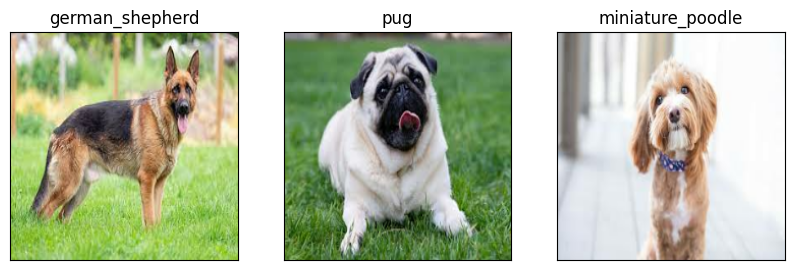

In [ ]:
# Check custom image predictions
plt.figure(figsize = (10,10))
for i , image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)